[![image](https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png)](https://www.visual-layer.com)

# Object Detection from Videos with YOLOv5

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/video-yolov5-detection.ipynb)
[![Open in Kaggle](https://kaggle.com/static/images/open-in-kaggle.svg)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/video-yolov5-detection.ipynb)

In this tutorial, we will use fastdup with a pretrained yolov5 object detection model to detect and crop from videos. Following that we analyze the cropped objects for issues such as duplicates, near-duplicates, outliers, bright/dark/blurry objects.

## Installation & Setting Up

In [ ]:
!pip install fastdup kaggle -Uq

In [1]:
import fastdup
fastdup.__version__

/usr/bin/dpkg


'1.30'

## Download & Extract Dataset


Let's download the [Video Fight Detection Dataset](https://www.kaggle.com/datasets/naveenk903/movies-fight-detection-dataset) from Kaggle. The dataset consists of real life videos of fight and non-fight scenes meant for video classification task.

You can download the dataset by manually by heading to the dataset [homepage](https://www.kaggle.com/datasets/naveenk903/movies-fight-detection-dataset) or using the [Kaggle API](https://github.com/Kaggle/kaggle-api). 

Let's use the Kaggle API to download the dataset:

In [ ]:
!kaggle datasets download -d naveenk903/movies-fight-detection-dataset

Next, extract the .zip file into a folder named `data`.

In [ ]:
!unzip -q movies-fight-detection-dataset.zip -d data

## Video to Images

fastdup works on images. We must first turn the videos into frames of images.

We can use a one-liner fastdup utility function to turn all the videos in a folder into frames. This should create a new folder called `frames` that has all the frames from the videos.

In [ ]:
fastdup.extract_video_frames(input_dir="data/", work_dir="frames/")

## Run fastdup

Now that we have the frames of images, let's run fastdup and analyze the frames.

In [2]:
fd = fastdup.create(input_dir='frames/')

For demonstration we'll just run on `num_images=2000`, feel free to change its value or omitting it altogether to run it on the entire dataset.

In [3]:
fd.run(bounding_box='yolov5s')

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
2023-07-24 15:37:16 [INFO] Going to loop over dir frames
2023-07-24 15:37:16 [INFO] Found total 4791 images to run on, 4791 train, 0 test, name list 4791, counter 4791 
FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.utes
2023-07-24 15:46:41 [INFO] Going to loop over dir /tmp/crops_input.csv
2023-07-24 15:46:41 [INFO] Found total 4908 images to run on, 4908 train, 0 test, name list 4908, counter 4908 
2023-07-24 15:46:54 [INFO] Found total 4908 images to run ontimated: 0 Minutes
Finished histogram 1.056
Finished bucket sort 1.071
2023-07-24 15:46:54 [INFO] 74) Finished write_index() NN model
2023-07-24 15:46:54 [INFO] Stored nn model index file work_dir/nnf.index
2023-07-24 15:46:54 [INFO] Total time took 13135 ms
2023-07-24 15:46:54 [INFO] Found a total of 154 fully identical images (d>0.990), which are 1.57 %
2023-07-24 15:46:54 [INFO] Found a total of 553 nearly identical images(d>0.

0

## Components Gallery

We can visualize the cluster of similar detections using the components gallery view. Specify `draw_bbox=True` to see the detection bounding box on the original image.

100%|████████████| 20/20 [00:01<00:00, 17.59it/s]
/home/dnth/anaconda3/envs/fastdup/lib/python3.10/site-packages/fastdup/galleries.py:933: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_components['label'] = top_components['label'].apply(lambda x: x[:MAX_IMAGES_IN_GRID])


Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 1.6



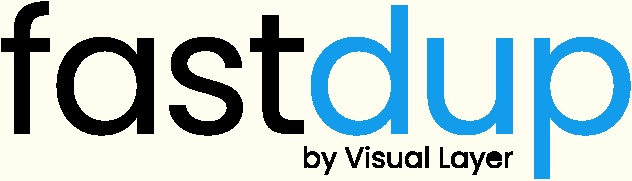
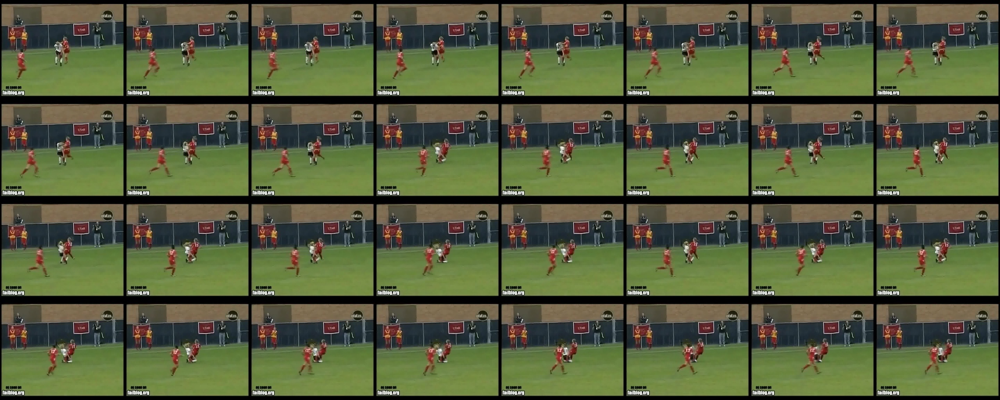
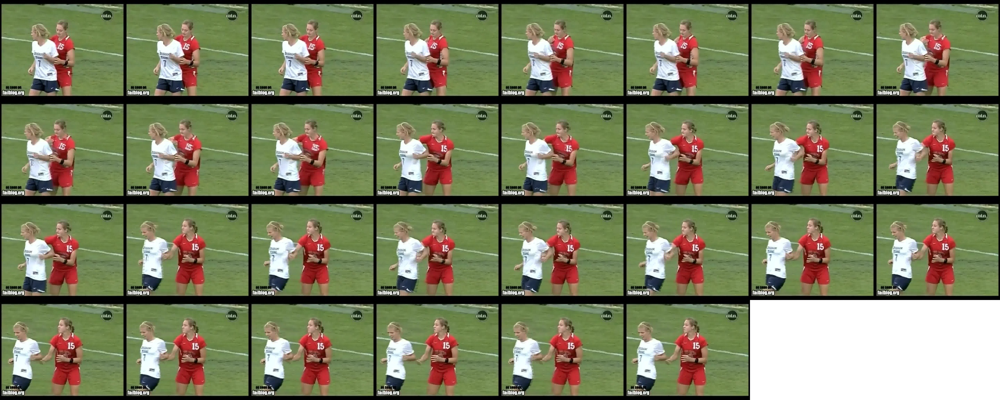
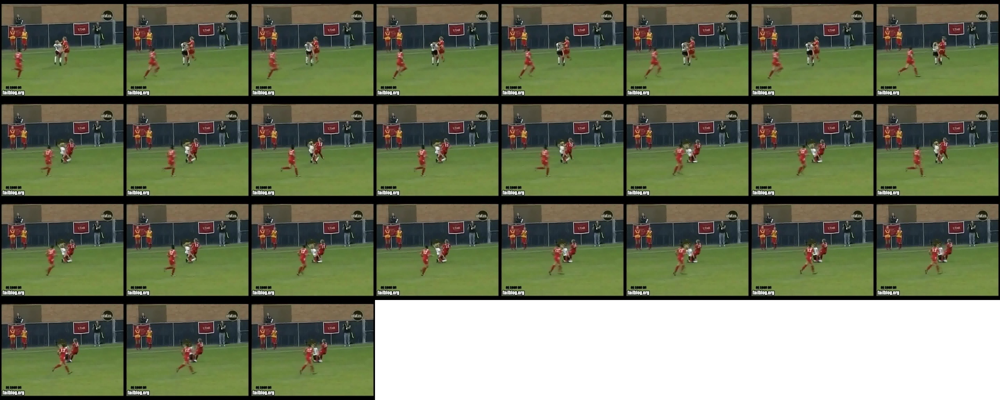
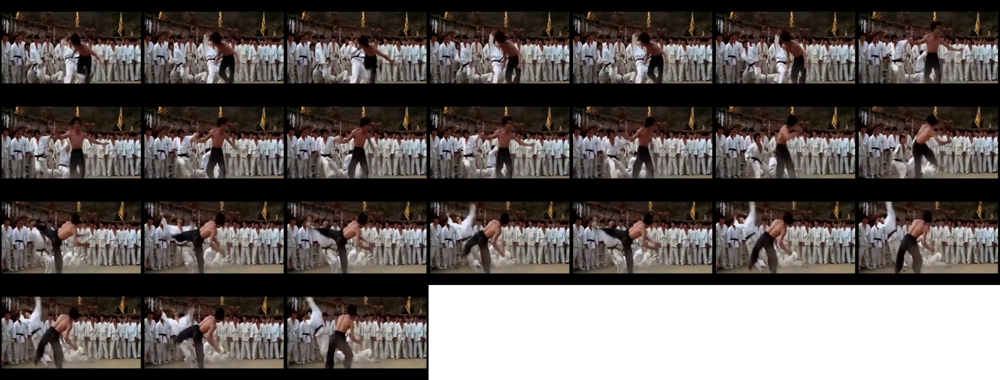
...
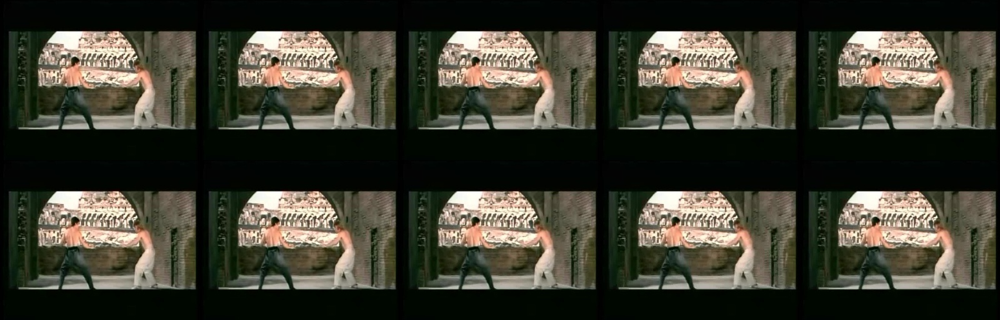
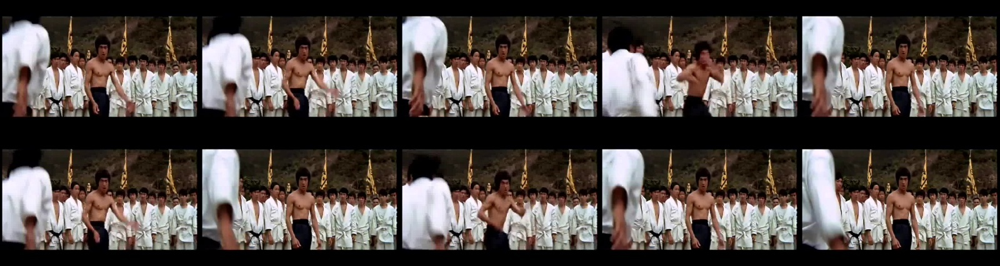
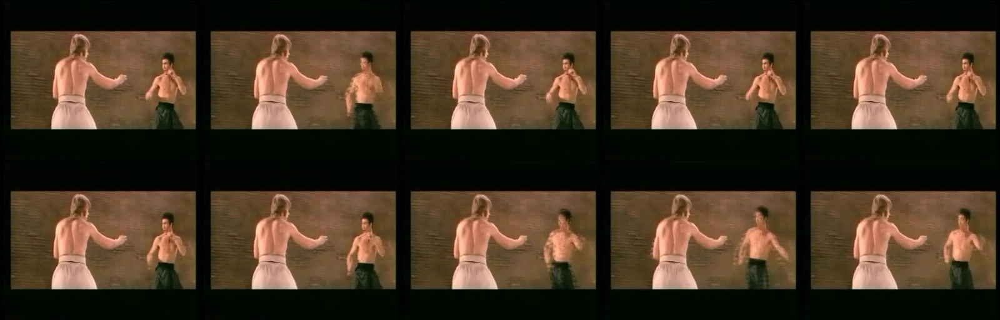
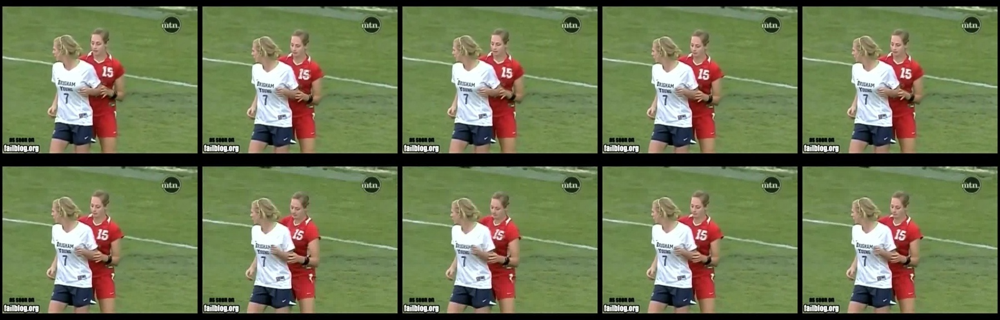
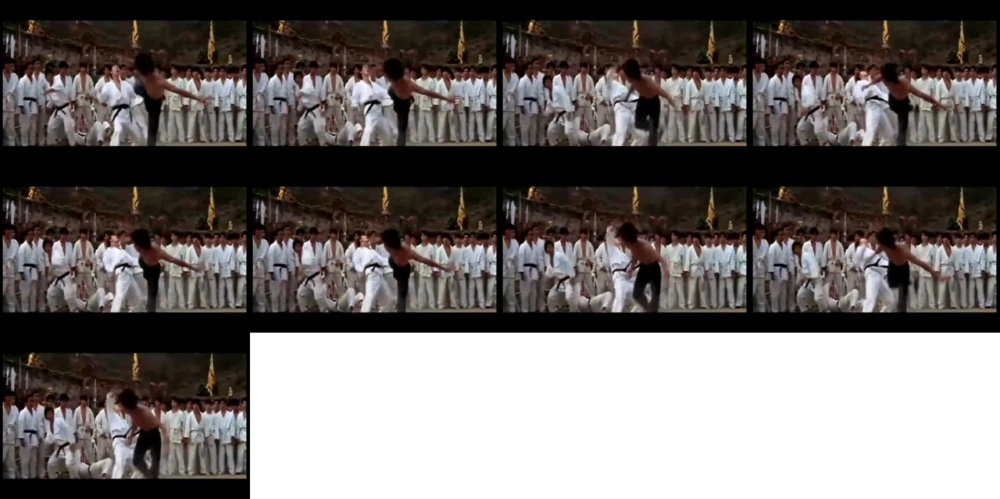

0

In [4]:
fd.vis.component_gallery(draw_bbox=True)

If you'd like to view just the cropped bounding box images, specify `draw_bbox=False`

100%|████████████| 20/20 [00:00<00:00, 39.85it/s]


Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 1.1



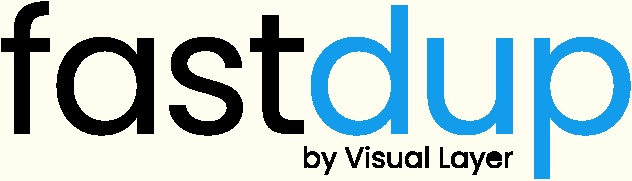
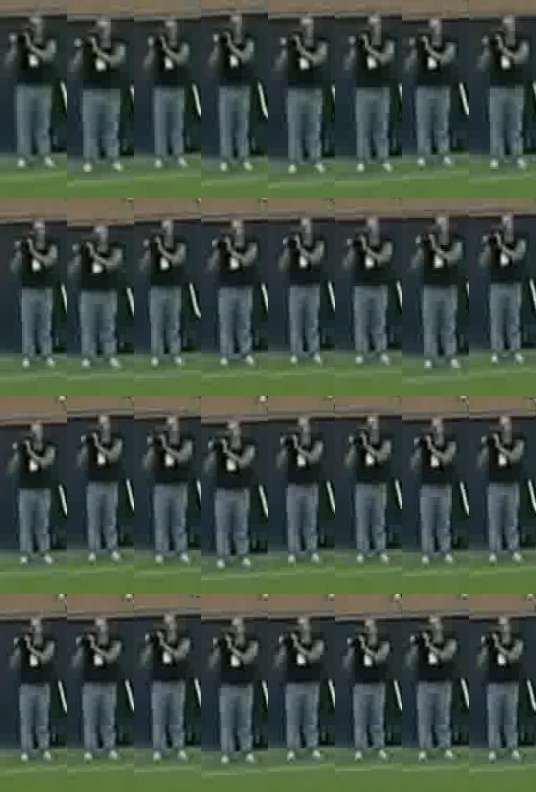
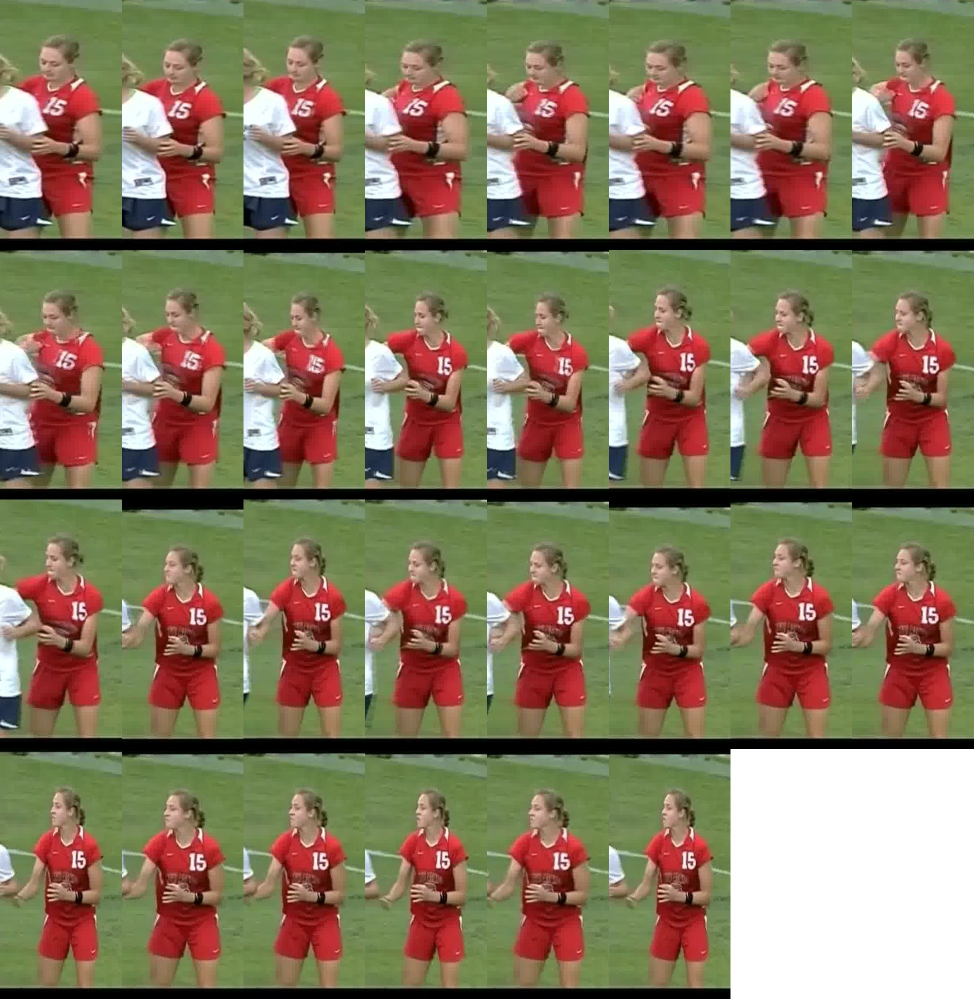
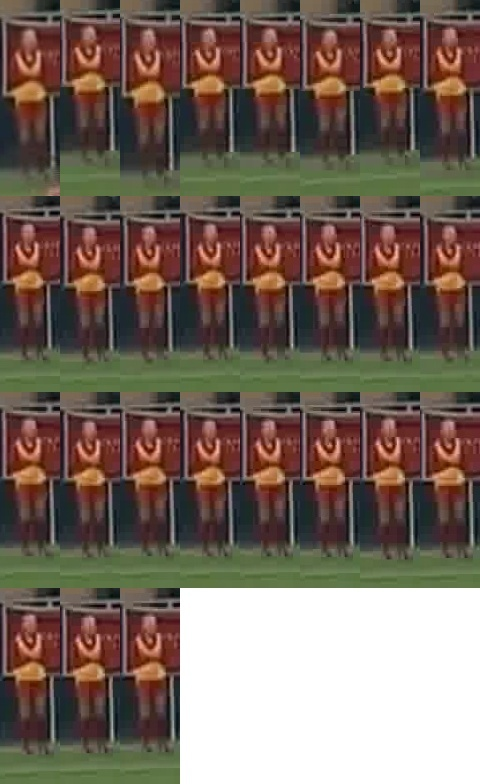
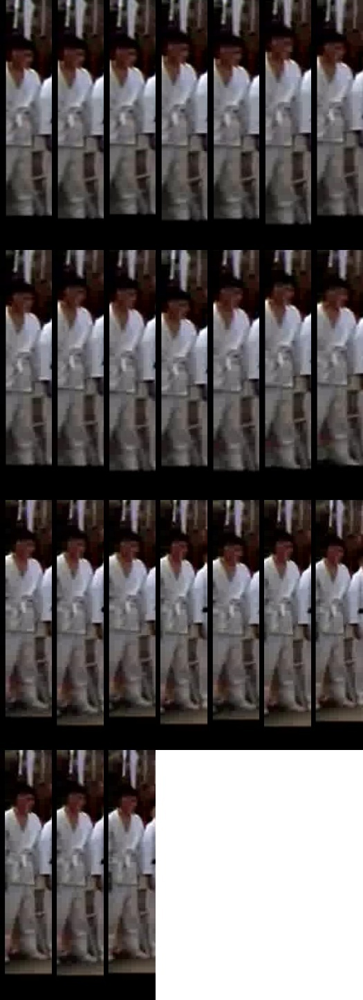
...
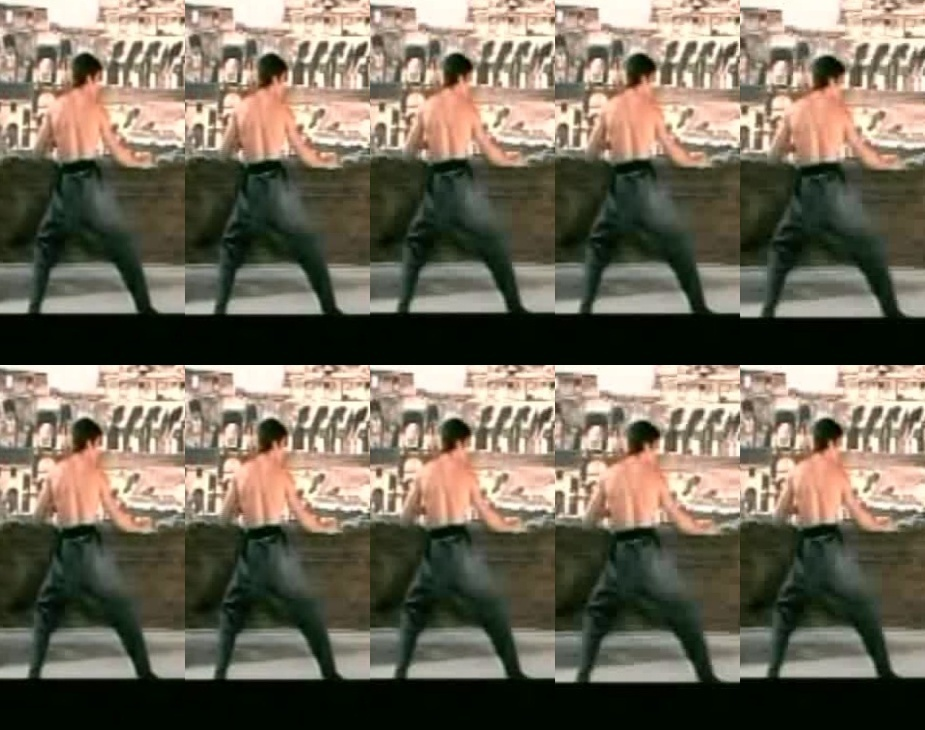
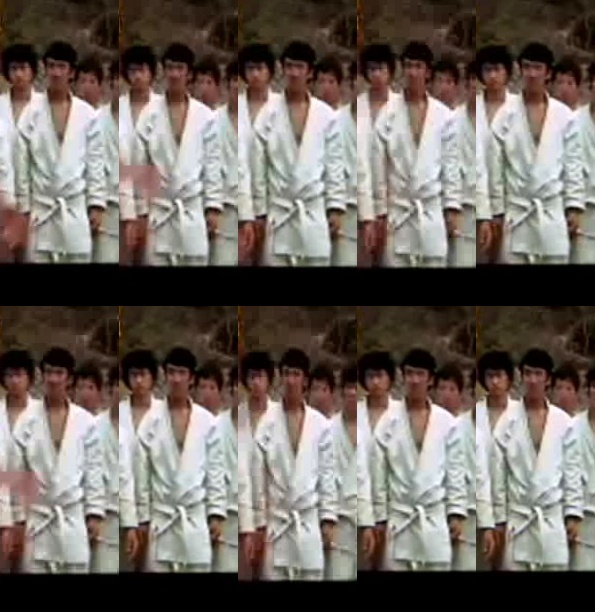
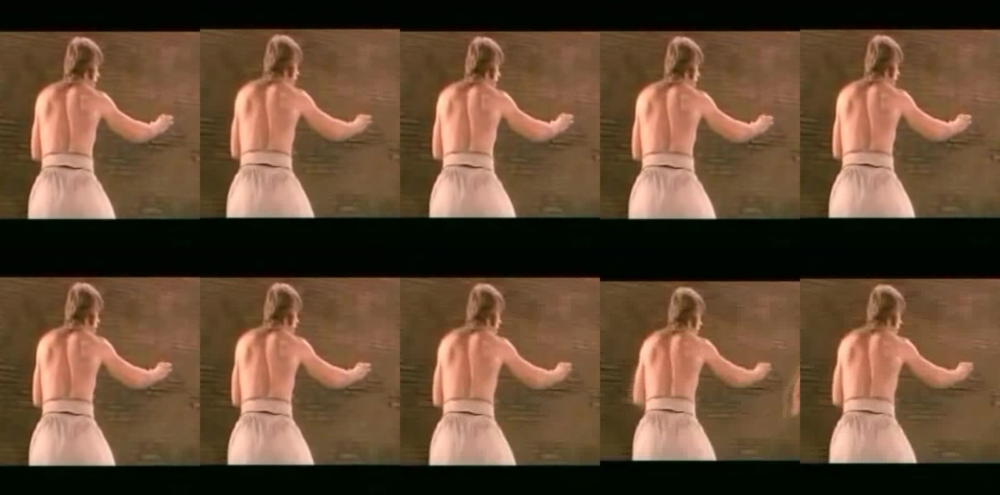
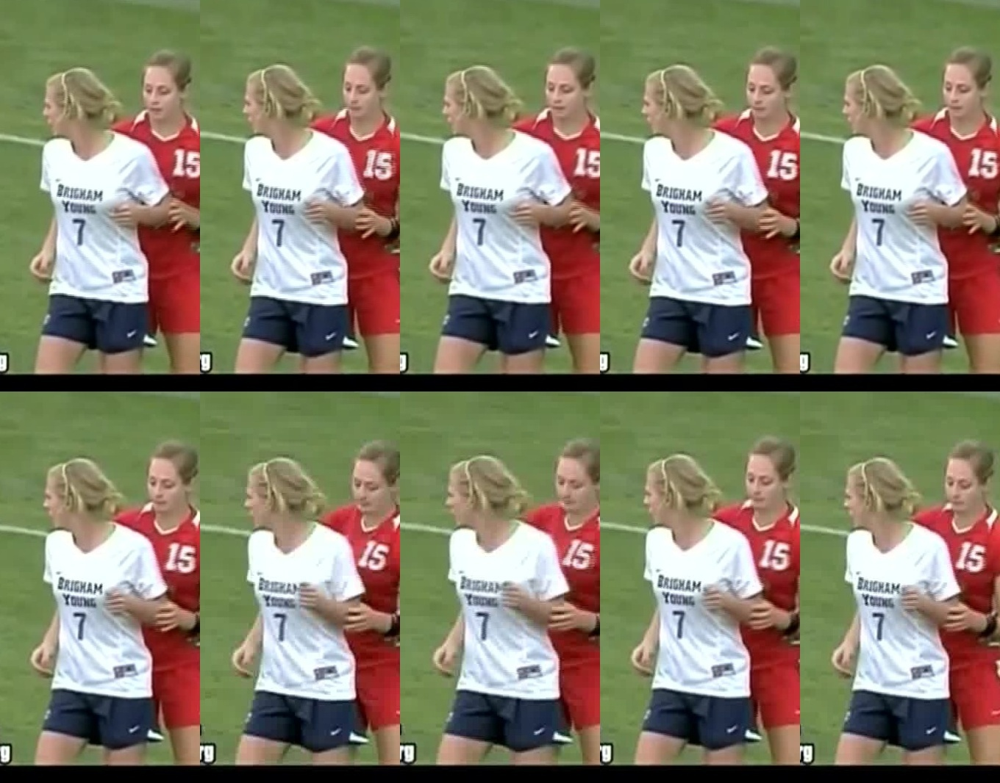
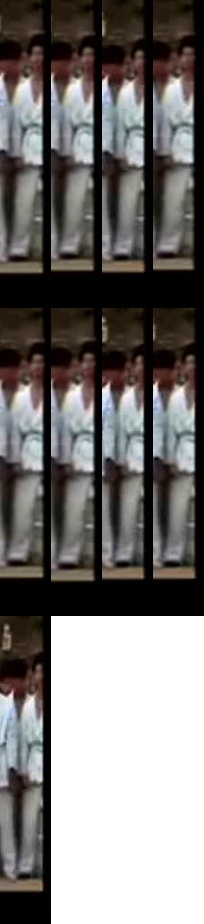

0

In [5]:
fd.vis.component_gallery(draw_bbox=False)

## Find Similar Objects Across Videos

Using the `similarity_gallery` view, we can find similar looking detections across all the extracted frames.

100%|███████████| 20/20 [00:00<00:00, 184.84it/s]


Stored similar images visual view in  work_dir/galleries/similarity.html



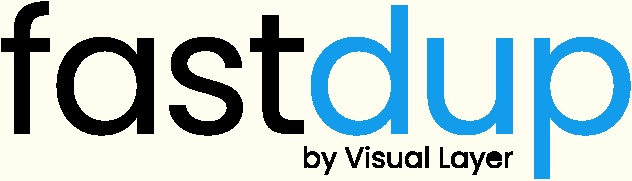
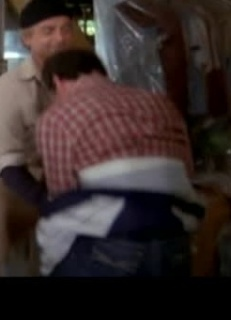
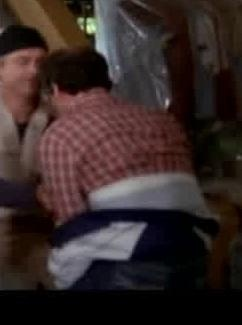
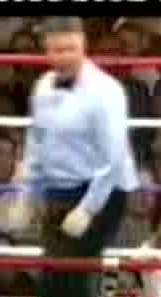
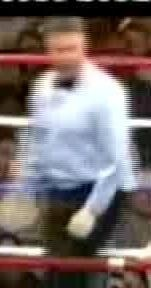
...
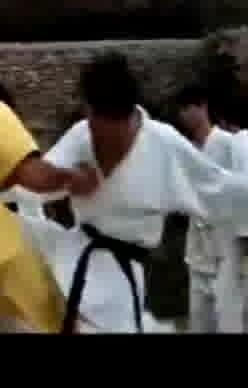
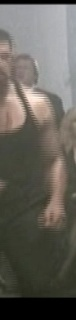
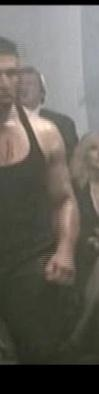
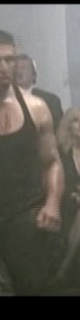
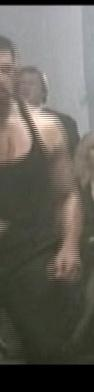

,from,to,distance
4190,work_dir/crops/framestmpdataPeliculasfightsnewfi99.avioutput_000001.jpg_425_179_176_244.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi99.avioutput_000007.jpg_430_181_174_233.jpg],[0.900044]
798,work_dir/crops/framestmpdataPeliculasfightsnewfi4.avioutput_000007.jpg_96_25_115_227.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi4.avioutput_000008.jpg_89_23_109_221.jpg],[0.900051]
2974,work_dir/crops/framestmpdataPeliculasfightsnewfi79.avioutput_000010.jpg_52_158_65_131.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi79.avioutput_000011.jpg_115_188_69_149.jpg],[0.900077]
3739,work_dir/crops/framestmpdataPeliculasfightsnewfi93.avioutput_000026.jpg_289_171_80_205.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi93.avioutput_000024.jpg_288_172_99_200.jpg],[0.900082]
3738,work_dir/crops/framestmpdataPeliculasfightsnewfi93.avioutput_000024.jpg_288_172_99_200.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi93.avioutput_000026.jpg_289_171_80_205.jpg],[0.900082]
...,...,...,...
263,work_dir/crops/framestmpdataPeliculasfightsnewfi2.avioutput_000002.jpg_11_16_73_168.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi1.avioutput_000002.jpg_11_16_73_168.jpg],[1.0]
1963,work_dir/crops/framestmpdataPeliculasfightsnewfi72.avioutput_000025.jpg_434_192_79_245.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi73.avioutput_000025.jpg_434_192_79_245.jpg],[1.0]
1961,work_dir/crops/framestmpdataPeliculasfightsnewfi72.avioutput_000013.jpg_467_216_79_239.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi73.avioutput_000013.jpg_467_216_79_239.jpg],[1.0]
2,work_dir/crops/framestmpdataPeliculasfightsnewfi1.avioutput_000002.jpg_11_16_73_168.jpg,[work_dir/crops/framestmpdataPeliculasfightsnewfi2.avioutput_000002.jpg_11_16_73_168.jpg],[1.0]


In [6]:
fd.vis.similarity_gallery(draw_bbox=False)

## Find Outliers

Useing the `outliers_gallery` we can also visualize detections that looks visually different from others.

100%|█████████| 20/20 [00:00<00:00, 34850.88it/s]


Stored outliers visual view in  work_dir/galleries/outliers.html



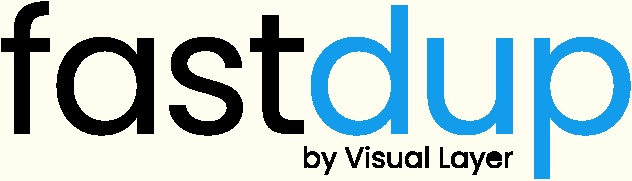
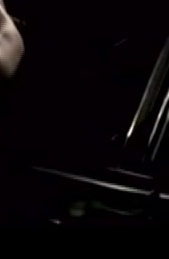
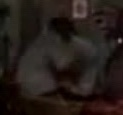
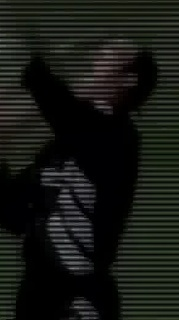
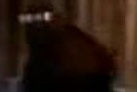
...
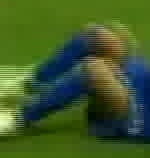
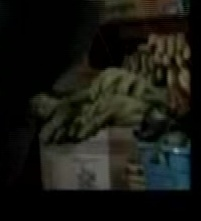
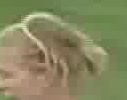
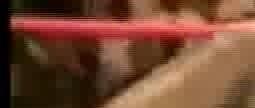
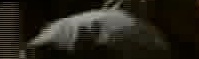

0

In [7]:
fd.vis.outliers_gallery()

## Duplicate Detections

With the `duplicates_gallery` view, visualize duplicate image pairs across videos.

100%|███████████| 20/20 [00:00<00:00, 237.49it/s]


Stored similarity visual view in  work_dir/galleries/duplicates.html



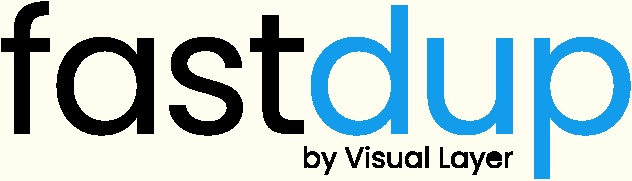
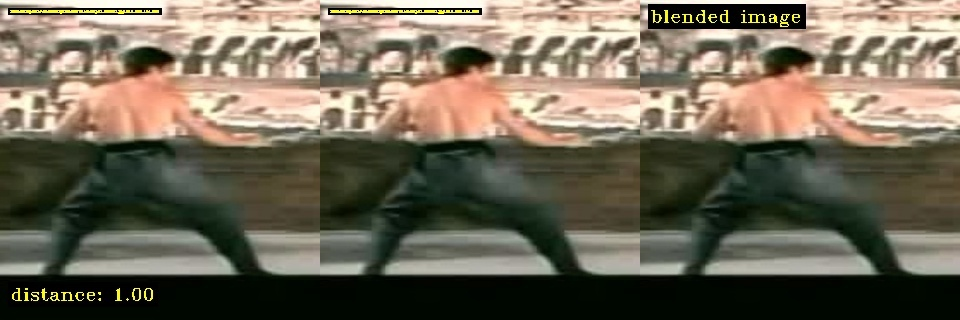
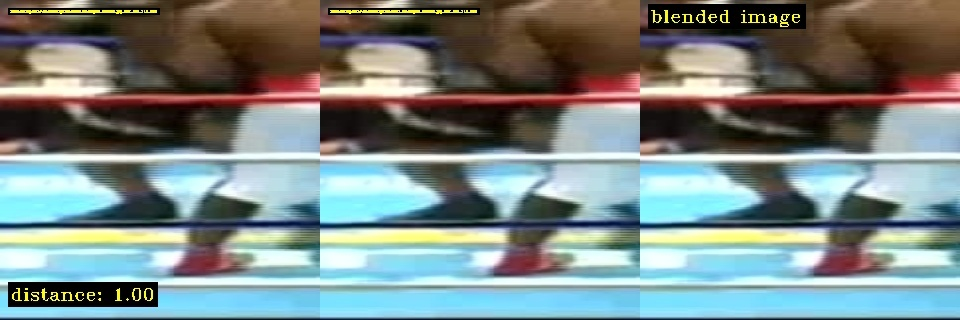
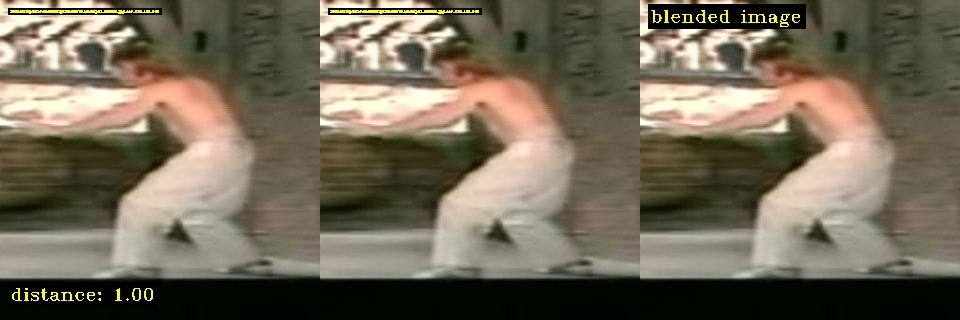
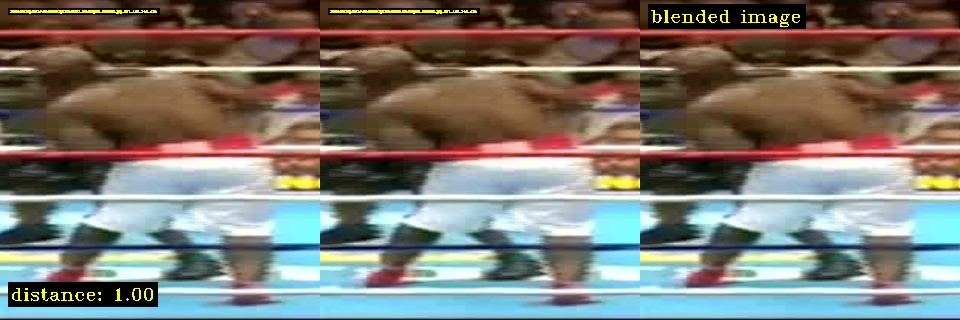
...
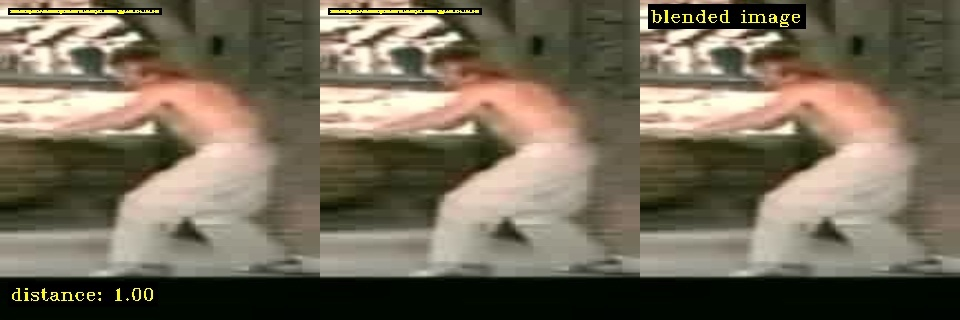
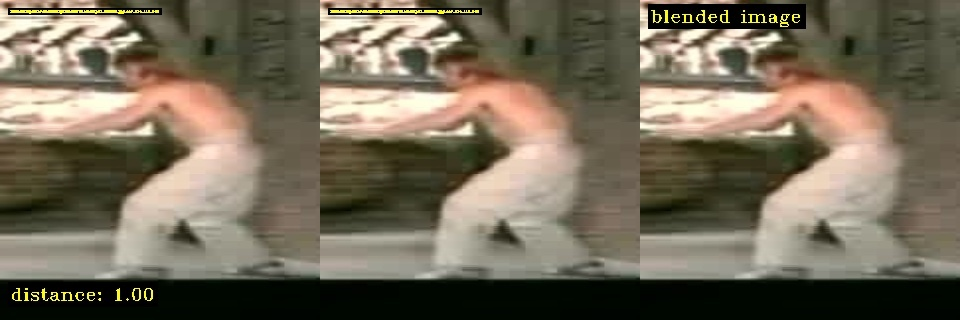
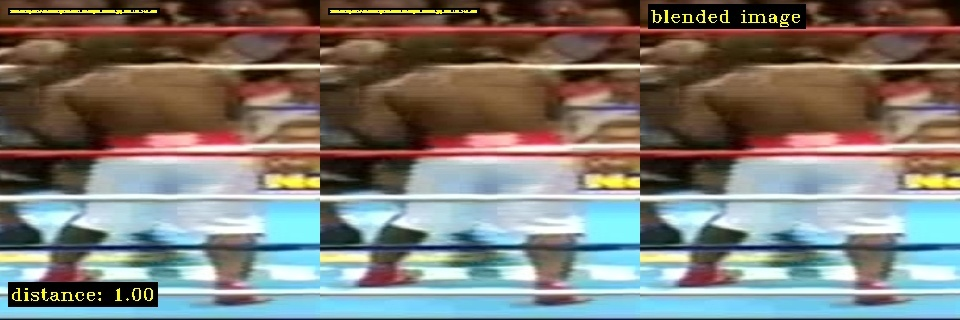
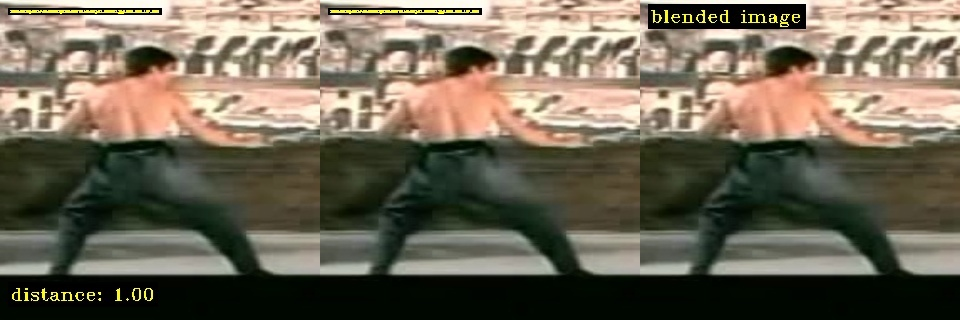
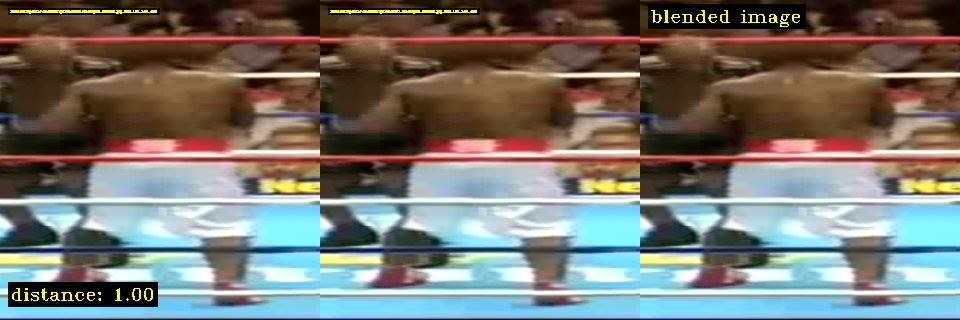

0

In [8]:
fd.vis.duplicates_gallery()

## Dark Detections

Using the `stats_gallery` view, we can sort the detections following a desired `metric` such as 'dark', 'bright' and 'blur'. 

In [ ]:
fd.vis.stats_gallery(metric='dark')

100%|██████████| 20/20 [00:00<00:00, 1612.26it/s]


Stored mean visual view in  work_dir/galleries/mean.html


## Bright Detections

In [ ]:
fd.vis.stats_gallery(metric='bright')

## Blurry Detections

In [ ]:
fd.vis.stats_gallery(metric='blur')

## Wrap Up

Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try. 


## VL Profiler
If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

[Sign up](https://app.visual-layer.com) now, it's free.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/vl_profiler_promo.svg)](https://app.visual-layer.com)

As usual, feedback is welcome! 

Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).